<a href="https://colab.research.google.com/github/victoriaporter58/Airline-Sentiment-Analysis-using-Machine-Learning/blob/main/Data_Exploration.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

#Data Exploration

In [ ]:
# cat requirements.txt

In [ ]:
# pip freeze > requirements.txt

## Import resources

In [ ]:
import matplotlib.pyplot as plt
import matplotlib.dates as dts
import matplotlib.image as mpimg
from tabulate import tabulate
import pandas as pd
import numpy as np
import itertools
from collections import Counter 
from wordcloud import WordCloud, STOPWORDS
from datetime import datetime, timedelta
import seaborn as sns
import itertools
import random 
from PIL import Image


In [ ]:
from google.colab import drive
drive.mount('/content/gdrive')

Go to this URL in a browser: https://accounts.google.com/o/oauth2/auth?client_id=947318989803-6bn6qk8qdgf4n4g3pfee6491hc0brc4i.apps.googleusercontent.com&redirect_uri=urn%3aietf%3awg%3aoauth%3a2.0%3aoob&scope=email%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdocs.test%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive.photos.readonly%20https%3a%2f%2fwww.googleapis.com%2fauth%2fpeopleapi.readonly&response_type=code

Enter your authorization code:
··········
Mounted at /content/gdrive


In [ ]:
tweets_data_path = '/content/gdrive/My Drive/Data Science TDA Group Project/Task2/Cleaning/Cleaned.csv'
tweets = pd.read_csv(tweets_data_path, header=0)

tweets_data_path = '/content/gdrive/My Drive/Data Science TDA Group Project/Task2/Data Exploration/worldmap2.png'
im = Image.open(tweets_data_path)

Resources:

https://www.kite.com/python/answers/how-to-plot-dates-on-the-x-axis-of-a-matplotlib-plot-in-python

https://www.geeksforgeeks.org/find-k-frequent-words-data-set-python/

https://www.data-to-viz.com/

https://www.mikulskibartosz.name/word-cloud-from-a-pandas-data-frame/

Size: 14640 rows × 15 columns

# Univariate Analysis
Including: airline_sentiment, airline_sentiment_confidence, negative reason, negativereason_confidence, airline, name, retweet_count, text, tweet_coord, tweet_created, tweet_location, user_timezone

Excluding: tweed_id, airline_sentiment_gold, negativereason_gold

In [ ]:
tweets

,tweet_id,airline_sentiment,airline_sentiment_confidence,negativereason,negativereason_confidence,airline,airline_sentiment_gold,name,negativereason_gold,retweet_count,text,tweet_coord,tweet_created,tweet_location,user_timezone
0,570306133677760513,neutral,1.0000,NaN,NaN,Virgin America,NaN,cairdin,NaN,0,virginamerica what dhepburn said,NaN,2015-02-24 11:35:52 -0800,NaN,Eastern Time (US & Canada)
1,570301130888122368,positive,0.3486,NaN,0.0000,Virgin America,NaN,jnardino,NaN,0,virginamerica plu ad commerci experi tacki,NaN,2015-02-24 11:15:59 -0800,NaN,Pacific Time (US & Canada)
2,570301083672813571,neutral,0.6837,NaN,NaN,Virgin America,NaN,yvonnalynn,NaN,0,virginamerica I today must mean I need take an...,NaN,2015-02-24 11:15:48 -0800,Lets Play,Central Time (US & Canada)
3,570301031407624196,negative,1.0000,Bad Flight,0.7033,Virgin America,NaN,jnardino,NaN,0,virginamerica realli aggress blast obnoxi ente...,NaN,2015-02-24 11:15:36 -0800,NaN,Pacific Time (US & Canada)
4,570300817074462722,negative,1.0000,Can't Tell,1.0000,Virgin America,NaN,jnardino,NaN,0,virginamerica realli big bad thing,NaN,2015-02-24 11:14:45 -0800,NaN,Pacific Time (US & Canada)
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
14635,569587686496825344,positive,0.3487,NaN,0.0000,American,NaN,KristenReenders,NaN,0,americanair thank got differ flight chicago,NaN,2015-02-22 12:01:01 -0800,NaN,NaN
14636,569587371693355008,negative,1.0000,Customer Service Issue,1.0000,American,NaN,itsropes,NaN,0,americanair leav 20 minut late flight No warn ...,NaN,2015-02-22 11:59:46 -0800,Texas,NaN
14637,569587242672398336,neutral,1.0000,NaN,NaN,American,NaN,sanyabun,NaN,0,americanair pleas bring american airlin blackb...,NaN,2015-02-22 11:59:15 -0800,"Nigeria,lagos",NaN
14638,569587188687634433,negative,1.0000,Customer Service Issue,0.6659,American,NaN,SraJackson,NaN,0,americanair money chang flight answer phone an...,NaN,2015-02-22 11:59:02 -0800,New Jersey,Eastern Time (US & Canada)


**General**

In [ ]:
print(tweets.columns)


Index(['tweet_id', 'airline_sentiment', 'airline_sentiment_confidence',
       'negativereason', 'negativereason_confidence', 'airline',
       'airline_sentiment_gold', 'name', 'negativereason_gold',
       'retweet_count', 'text', 'tweet_coord', 'tweet_created',
       'tweet_location', 'user_timezone'],
      dtype='object')


In [ ]:
tweets.dtypes

tweet_id                        float64
airline_sentiment                object
airline_sentiment_confidence    float64
negativereason                   object
negativereason_confidence       float64
airline                          object
airline_sentiment_gold           object
name                             object
negativereason_gold              object
retweet_count                     int64
text                             object
tweet_coord                      object
tweet_created                    object
tweet_location                   object
user_timezone                    object
dtype: object

**Sentiment**

*Categorical*

Text(0.5, 0, 'Sentiment')

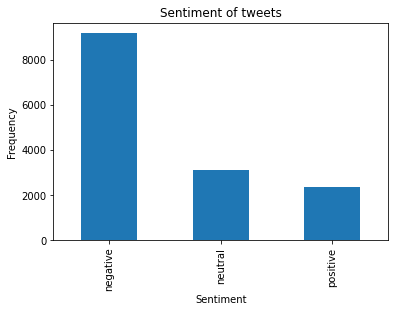

In [ ]:
plt.figure()
tweets['airline_sentiment'].value_counts().plot.bar()
plt.title("Sentiment of tweets")
plt.ylabel("Frequency")
plt.xlabel("Sentiment")


Text(0.5, 1.0, 'Sentiment of tweets')

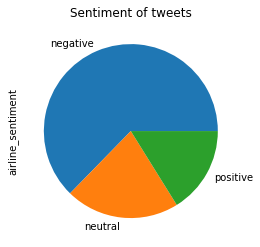

In [ ]:
tweets['airline_sentiment'].value_counts().plot.pie()
plt.title("Sentiment of tweets")

In [ ]:
tweets['airline_sentiment']

0         neutral
1        positive
2         neutral
3        negative
4        negative
           ...   
14635    positive
14636    negative
14637     neutral
14638    negative
14639     neutral
Name: airline_sentiment, Length: 14640, dtype: object

In [ ]:
tweets['airline_sentiment'].sort_values(ascending=False).unique()

array(['positive', 'neutral', 'negative'], dtype=object)

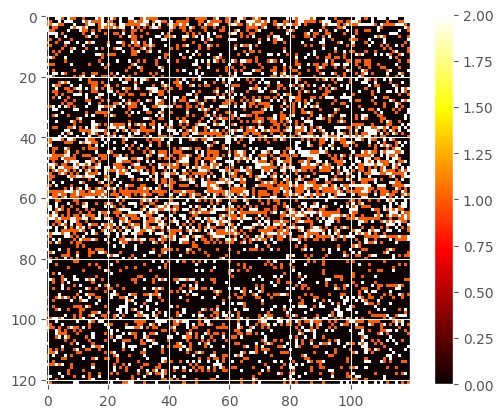

In [ ]:
numericSentiment = []


categories = tweets['airline_sentiment'].sort_values(ascending=True).unique()

for elem in tweets['airline_sentiment']:
  for category in categories:
    if elem == category:
      categoryValue = np.where(categories == category)
      numericSentiment.append(categoryValue[0][0])



numSentimentM = np.array(numericSentiment).reshape((122,120))

plt.imshow(numSentimentM, cmap='hot',  interpolation='nearest')
plt.colorbar()
plt.show()

Key:
- White = Positive
- Red = Neutral
- Black = Negative

**Sentiment confidence**

*Numerical*

Most common values?

In [ ]:
tweets['airline_sentiment_confidence'].value_counts()

1.0000    10445
0.6667       71
0.6632       35
0.6596       30
0.6559       30
          ...  
0.7071        1
0.3658        1
0.7135        1
0.6615        1
0.3389        1
Name: airline_sentiment_confidence, Length: 1023, dtype: int64

Text(0.5, 0, 'Confidence')

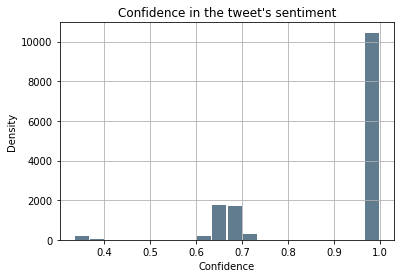

In [ ]:
tweets['airline_sentiment_confidence'].plot.hist(grid=True, bins=20, rwidth=0.9, color='#607c8e')
plt.title("Confidence in the tweet's sentiment")
plt.ylabel("Density")
plt.xlabel("Confidence")

**Negative reason**

*Categorical*

Text(0.5, 0, 'Reason')

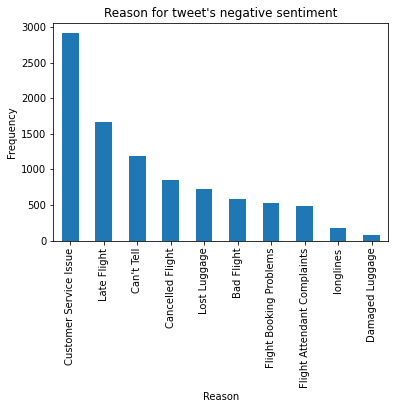

In [ ]:
tweets['negativereason'].value_counts().plot.bar()
plt.title("Reason for tweet's negative sentiment")
plt.ylabel("Frequency")
plt.xlabel("Reason")



Text(0.5, 1.0, "Reason for tweet's negative sentiment")

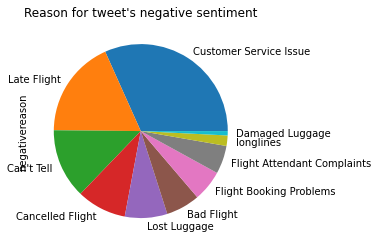

In [ ]:
tweets['negativereason'].value_counts().plot.pie()
plt.title("Reason for tweet's negative sentiment")


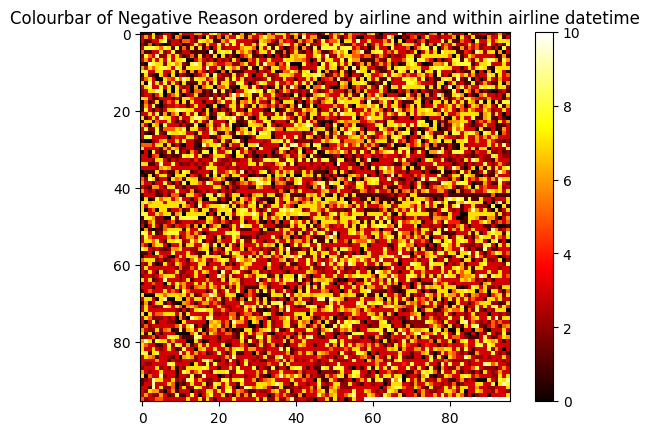

In [ ]:
numericReason = []
matrixL1 = 96
matrixL2 = 96
#26 * 353 = 9178
#96 * 96 = 9216

categories = tweets['negativereason'].sort_values(ascending=True).unique()

for elem in tweets['negativereason']:
  for category in categories:
    if elem == category:
      categoryValue = np.where(categories == category)
      numericReason.append(categoryValue[0][0])
    
if matrixL1*matrixL2 != len(numericReason):
  diff = matrixL1*matrixL2-len(numericReason)#38
  for i in range(diff):
    numericReason.append(len(categories)-1)


numReasonM = np.array(numericReason).reshape((matrixL1,matrixL2))

plt.imshow(numReasonM, cmap='hot',  interpolation='nearest')
plt.title("Colourbar of Negative Reason ordered by airline and within airline datetime")
plt.colorbar()
plt.show()

In [ ]:
for elem in categories:
  print("Category: "+str(elem)+" = "+ str(np.where(categories == elem)[0]))

Category: Bad Flight = [0]
Category: Can't Tell = [1]
Category: Cancelled Flight = [2]
Category: Customer Service Issue = [3]
Category: Damaged Luggage = [4]
Category: Flight Attendant Complaints = [5]
Category: Flight Booking Problems = [6]
Category: Late Flight = [7]
Category: Lost Luggage = [8]
Category: longlines = [9]
Category: nan = []


**Negative reason confidence**

*Numerical*

Text(0.5, 0, 'Confidence')

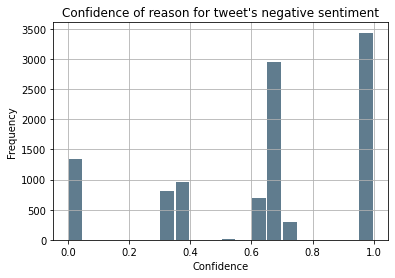

In [ ]:
tweets['negativereason_confidence'].plot.hist(grid=True, bins=20, rwidth=0.9, color='#607c8e')
plt.title("Confidence of reason for tweet's negative sentiment")
plt.ylabel("Frequency")
plt.xlabel("Confidence")

**Airlines**

*Categorical*

Text(0.5, 0, 'Airline')

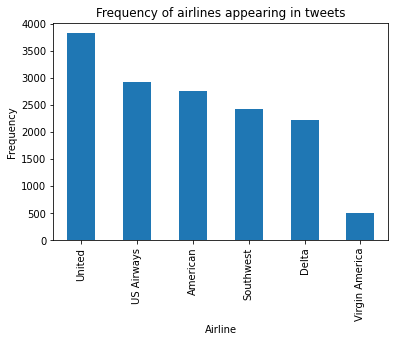

In [ ]:
#tweets['airline'].unique()
#df = pd.value_counts(tweets.airline_sentiment).to_frame()

#plt.figure()
#plot method on Series and DataFame is a wrapper around plt.plot

tweets['airline'].value_counts().plot.bar()
plt.title("Frequency of airlines appearing in tweets")
plt.ylabel("Frequency")
plt.xlabel("Airline")


Text(0.5, 0, 'Airline')

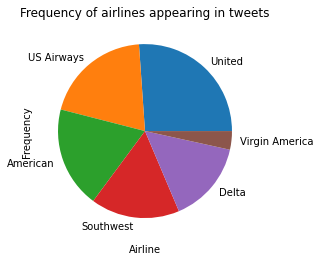

In [ ]:
tweets['airline'].value_counts().plot.pie()
plt.title("Frequency of airlines appearing in tweets")
plt.ylabel("Frequency")
plt.xlabel("Airline")

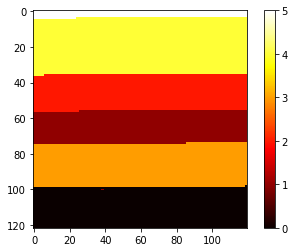

In [ ]:
numAirlines = []
matrixL1 = 122
matrixL2 = 120


categories = tweets['airline'].sort_values(ascending=True).unique()

for elem in tweets['airline']:
  for category in categories:
    if elem == category:
      categoryValue = np.where(categories == category)
      numAirlines.append(categoryValue[0][0])
    
if matrixL1*matrixL2 != len(numAirlines):
  diff = matrixL1*matrixL2-len(numAirlines)
  for i in range(diff):
    numAirlines.append(len(categories)-1)


numAirlinesM = np.array(numAirlines).reshape((matrixL1,matrixL2))

plt.imshow(numAirlinesM, cmap='hot',  interpolation='nearest')
plt.colorbar()
plt.show()

In [ ]:
for elem in categories:
  print("Category: "+str(elem)+" = "+ str(np.where(categories == elem)[0][0]))

Category: American = 0
Category: Delta = 1
Category: Southwest = 2
Category: US Airways = 3
Category: United = 4
Category: Virgin America = 5


**Name**

*Other* 



In [ ]:
tweetsNameCount = tweets['name'].value_counts()
tweetsNameCount[tweetsNameCount > 2]

JetBlueNews       63
kbosspotter       32
_mhertz           29
otisday           28
throthra          27
                  ..
Ted_Bray           3
Kyle_Clarke528     3
michael_lepp       3
CaroDavis2012      3
RhodseyM           3
Name: name, Length: 1458, dtype: int64

In [ ]:
test = tweetsNameCount[tweetsNameCount > 1]

Text(0.5, 0, 'Number of Tweets')

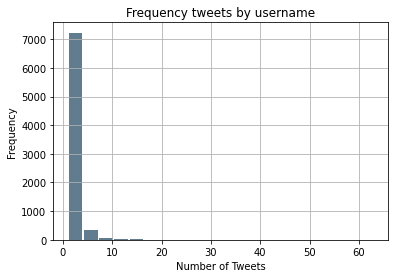

In [ ]:
# tweets['name'].value_counts().plot.bar()
# plt.title("Frequency tweets by username")
# plt.ylabel("Number of tweets")
# plt.xlabel("Name")

# tweetsNameCount = tweets['name'].value_counts()
# tweetsNameCount[tweetsNameCount > 2].plot.hist(grid=True, bins=20, rwidth=0.9, color='#607c8e')


tweets['name'].value_counts().plot.hist(grid=True, bins=20, rwidth=0.9,
                   color='#607c8e')
plt.title("Frequency tweets by username")
plt.ylabel("Frequency")
plt.xlabel("Number of Tweets")

Text(0.5, 0, 'Number of Tweets')

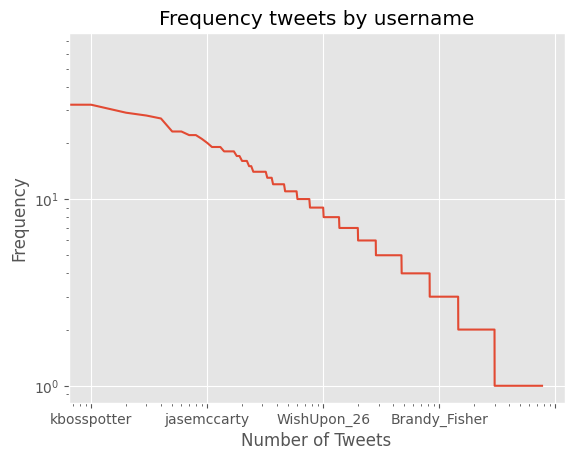

In [ ]:
tweets['name'].value_counts().plot(loglog=True)
plt.title("Frequency tweets by username")
plt.ylabel("Frequency")
plt.xlabel("Number of Tweets")

In [ ]:
tweets[tweets['name'].str.contains("news")]

,tweet_id,airline_sentiment,airline_sentiment_confidence,negativereason,negativereason_confidence,airline,airline_sentiment_gold,name,negativereason_gold,retweet_count,text,tweet_coord,tweet_created,tweet_location,user_timezone
5062,5.694516e+17,positive,0.6842,NaN,NaN,Southwest,NaN,wabenews,NaN,0,southwestair offer atlanta unpreced perk http ...,NaN,2015-02-22 03:00:09 -0800,"Atlanta, GA",Eastern Time (US & Canada)
5642,5.688415e+17,neutral,0.6476,NaN,NaN,Southwest,NaN,capgaznews,NaN,0,southwestair ceo kelli draw record crowd bwi_a...,NaN,2015-02-20 10:36:02 -0800,"Annapolis, MD USA",Eastern Time (US & Canada)
6024,5.684317e+17,neutral,1.0000,NaN,NaN,Southwest,NaN,judesnews9222,NaN,0,southwestair add new direct flight columbu oak...,NaN,2015-02-19 07:27:37 -0800,"Columbus, Ohio",NaN
8046,5.688393e+17,neutral,1.0000,NaN,NaN,Delta,NaN,IFEnews,NaN,0,jetblu the wsj team offer In flight access jou...,NaN,2015-02-20 10:27:07 -0800,FL350,Sydney
9329,5.699836e+17,negative,1.0000,Customer Service Issue,1.0000,US Airways,NaN,acnewsguy,NaN,0,usairway she put hold number loooooong time No...,NaN,2015-02-23 14:14:11 -0800,"New Haven, CT",Mountain Time (US & Canada)
9498,5.699058e+17,negative,1.0000,Lost Luggage,0.6735,US Airways,NaN,acnewsguy,NaN,0,usairway anoth dead end they handl AA L amp F ...,NaN,2015-02-23 09:04:59 -0800,"New Haven, CT",Mountain Time (US & Canada)
9529,5.698903e+17,negative,1.0000,Customer Service Issue,1.0000,US Airways,NaN,acnewsguy,NaN,0,usairway acnewsguy give US air philli talk rea...,NaN,2015-02-23 08:03:32 -0800,"New Haven, CT",Mountain Time (US & Canada)
9728,5.696928e+17,negative,1.0000,Customer Service Issue,0.7129,US Airways,NaN,acnewsguy,NaN,0,usairway what lost amp found My wife lost phon...,NaN,2015-02-22 18:58:51 -0800,"New Haven, CT",Mountain Time (US & Canada)
14232,5.696497e+17,negative,1.0000,longlines,0.6890,American,NaN,cwalshnews,NaN,0,americanair today wait violat dot passengerbil...,NaN,2015-02-22 16:07:37 -0800,NaN,Pacific Time (US & Canada)
14283,5.696421e+17,negative,0.6835,Customer Service Issue,0.6835,American,NaN,cwalshnews,NaN,0,americanair one met flight 1081 lax tell passe...,NaN,2015-02-22 15:37:25 -0800,NaN,Pacific Time (US & Canada)


In [ ]:
newsTweets = tweets[tweets['name'].str.contains("news")]
len(newsTweets)

12

Text(0.5, 0, 'Number of Tweets')

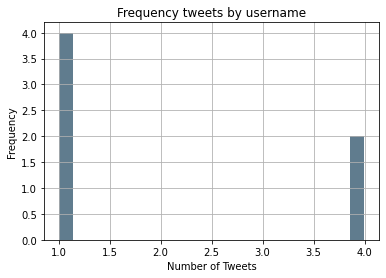

In [ ]:
newsTweets['name'].value_counts().plot.hist(grid=True, bins=20, rwidth=0.9,
                   color='#607c8e')
plt.title("Frequency tweets by username")
plt.ylabel("Frequency")
plt.xlabel("Number of Tweets")

**Retweet count**

*Numerical*

In [ ]:
tweets['retweet_count'].value_counts()

0     13873
1       640
2        66
3        22
4        17
5         5
7         3
6         3
22        2
8         1
32        1
9         1
31        1
18        1
15        1
28        1
44        1
11        1
Name: retweet_count, dtype: int64

Text(0.5, 0, 'Number of Retweets')

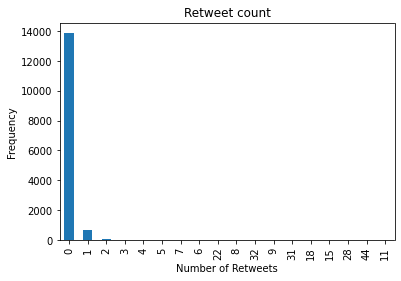

In [ ]:

# Histogram
# tweets['retweet_count'].plot.hist(grid=True, bins=20, rwidth=0.9,
#                    color='#607c8e')
# plt.title("Number of retweets for the tweets")
# plt.ylabel("Frequency")
# plt.xlabel("Tweets")

tweets['retweet_count'].value_counts().plot.bar()
plt.title("Retweet count")
plt.ylabel("Frequency")
plt.xlabel("Number of Retweets")

**Text**

*Other*

In [ ]:
example = '@VirginAmerica plus you\'ve added commercials to the experience... tacky.'
print(example.split())

['@VirginAmerica', 'plus', "you've", 'added', 'commercials', 'to', 'the', 'experience...', 'tacky.']


In [ ]:
tweets['text']

0                         virginamerica what dhepburn said
1               virginamerica plu ad commerci experi tacki
2        virginamerica I today must mean I need take an...
3        virginamerica realli aggress blast obnoxi ente...
4                       virginamerica realli big bad thing
                               ...                        
14635          americanair thank got differ flight chicago
14636    americanair leav 20 minut late flight No warn ...
14637    americanair pleas bring american airlin blackb...
14638    americanair money chang flight answer phone an...
14639    americanair 8 ppl need 2 know mani seat next f...
Name: text, Length: 14640, dtype: object

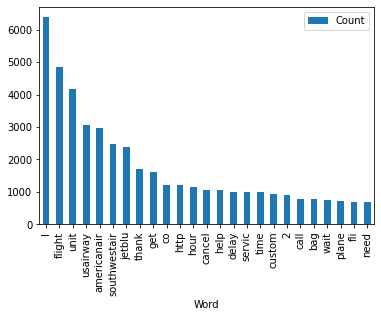

In [ ]:


tweet_text = tweets['text']

tweet_sentences = [elem.split() for elem in tweet_text]

tweet_words = list(itertools.chain.from_iterable(tweet_sentences))

counter = Counter(tweet_words)
  
most_occur = counter.most_common(25)
df2 = pd.DataFrame(most_occur,columns = ['Word','Count'])
df2.plot.bar(x='Word',y='Count')

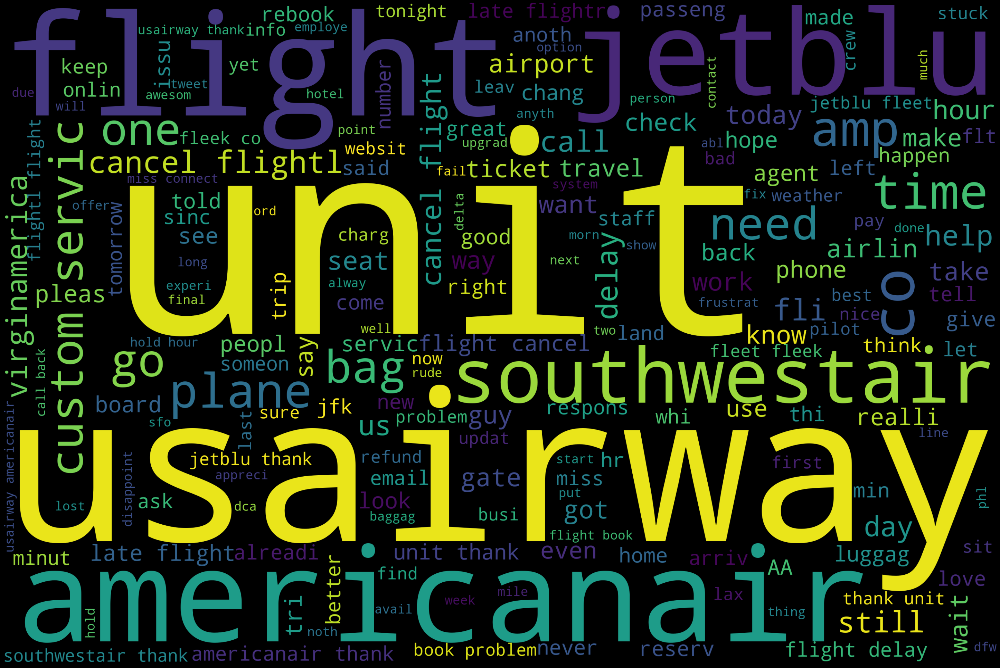

In [ ]:

#text = tweet_words
tweet_textClean = ' '.join(tweet_words)
#text = "Tom Ford Jessica Alba Nicolas Cage"
wordcloud = WordCloud(
    width = 3000,
    height = 2000,
    background_color = 'black',
    stopwords = STOPWORDS).generate(str(tweet_textClean))
fig = plt.figure(
    figsize = (40, 30),
    facecolor = 'k',
    edgecolor = 'k')
plt.imshow(wordcloud, interpolation = 'bilinear')
plt.axis('off')
plt.tight_layout(pad=0)
plt.show()

**Tweet creation date & time**

*Other*

Text(0, 0.5, 'Time/h')

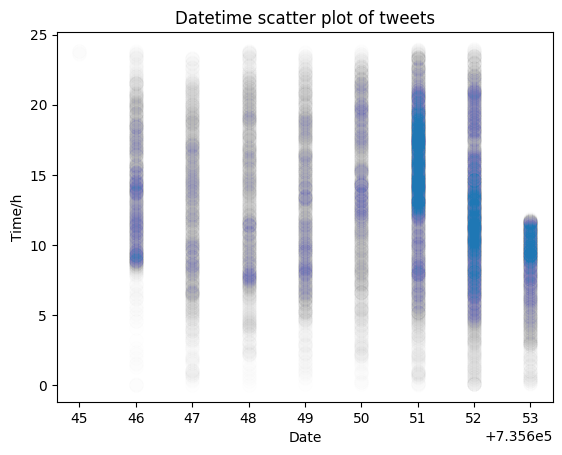

In [ ]:

def hours(t):
  return t.hour + t.minute/60 + t.second/3600

dates_string = tweets['tweet_created']
date_DT = [datetime.strptime(d[:-6],'%Y-%m-%d %H:%M:%S') for d in dates_string]


dates_float_ls = [dts.date2num(d.date()) for d in date_DT]
times_int_ls = [hours(d) for d in date_DT]


plt.scatter(dates_float_ls,times_int_ls,alpha=0.005,cmap='viridis', s=100)
plt.title('Datetime scatter plot of tweets')
plt.xlabel('Date')
plt.ylabel('Time/h')

**Tweet co-ordinates, location and timezone**

*Other*

Tweet Co-ord

In [ ]:
tweets['tweet_coord'].value_counts()

[0.0, 0.0]                     164
[40.64656067, -73.78334045]      6
[32.91792297, -97.00367737]      3
[40.64646912, -73.79133606]      3
[34.0213466, -118.45229268]      2
                              ... 
[40.64534568, -73.77609616]      1
[36.14488928, -86.68739667]      1
[41.72221977, -71.44574004]      1
[39.52438256, -74.70144898]      1
[33.00605781, -96.76519155]      1
Name: tweet_coord, Length: 833, dtype: int64

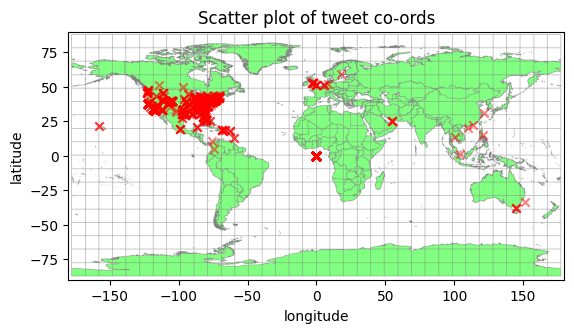

In [ ]:
 xCoord = []
 yCoord = []
 
 coords = tweets['tweet_coord']
 for coord in coords:
   #print("type: "+str(type(coord))+", coord: "+str(coord))
   if (type(coord) == str) and (coord != 'nan'):#not NaN
     space = coord.find(' ')
     yCoord.append(float(coord[1:space-1]))
     bracket = coord.find(']')
     xCoord.append(float(coord[space+1:bracket]))




# Change shape of marker
# sns.regplot(x=df["longitude"], y=df["latitude"], marker="+", fit_reg=False)


plt.imshow(im, extent=[-180, 180, -90, 90], alpha=0.5)

plt.scatter(xCoord,yCoord,alpha=0.5,marker='x',c='r')
plt.title('Scatter plot of tweet co-ords')
plt.xlabel('longitude')
plt.ylabel('latitude')
plt.show()

Tweet Location

In [ ]:
tweets['tweet_location'].value_counts()


Boston, MA                      157
New York, NY                    156
Washington, DC                  150
New York                        137
USA                             128
                               ... 
Miami, FL                         1
Orange County                     1
iPhone: 39.285219,-76.622649      1
Opelika, Alabama                  1
West Chester, PA                  1
Name: tweet_location, Length: 3022, dtype: int64

Text(0.5, 0, 'Location')

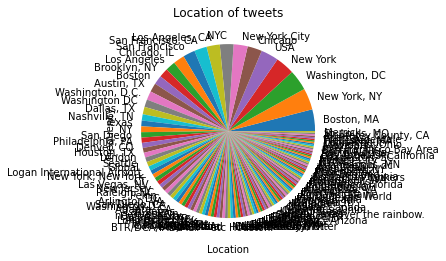

In [ ]:
tweetLocation = tweets['tweet_location'].value_counts()
tweetLocation[tweetLocation>10].plot.pie()
plt.title("Location of tweets")
plt.ylabel("Frequency")
plt.xlabel("Location")

Text(0.5, 0, 'Location')

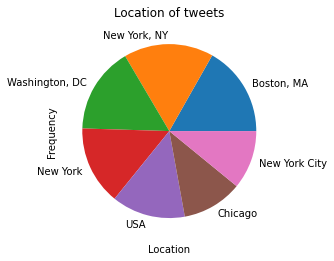

In [ ]:
tweetLocation = tweets['tweet_location'].value_counts()
tweetLocation[tweetLocation>100].plot.pie()
plt.title("Location of tweets")
plt.ylabel("Frequency")
plt.xlabel("Location")

Text(0.5, 0, 'Location')

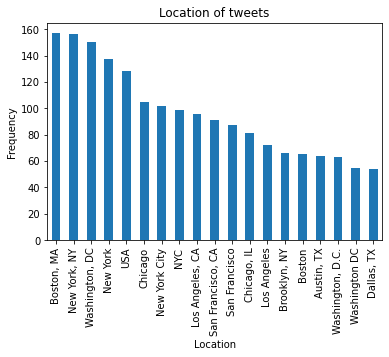

In [ ]:
tweetLocation = tweets['tweet_location'].value_counts()
tweetLocation[tweetLocation>50].plot.bar()
plt.title("Location of tweets")
plt.ylabel("Frequency")
plt.xlabel("Location")

User Timezone

*Categorical*

Text(0.5, 0, 'Location')

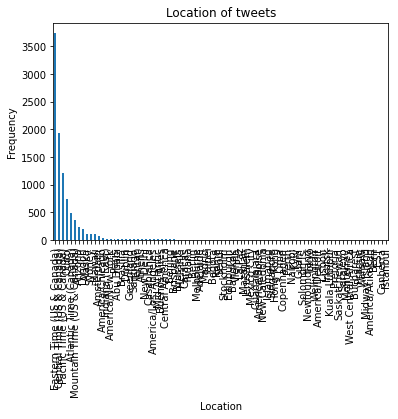

In [ ]:
tweets['user_timezone'].value_counts().plot.bar()
plt.title("Location of tweets")
plt.ylabel("Frequency")
plt.xlabel("Location")

Text(0.5, 0, 'Location')

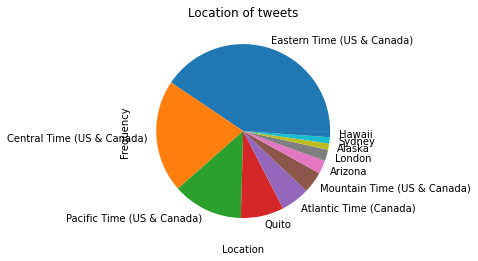

In [ ]:
tweetsTimezoneCount = tweets['user_timezone'].value_counts()
tweetsTimezoneCount[tweetsTimezoneCount > 100].plot.pie()
plt.title("Location of tweets")

# Bi-variate Analysis

**Airline & Sentiment**

*Categorical & Categorical*




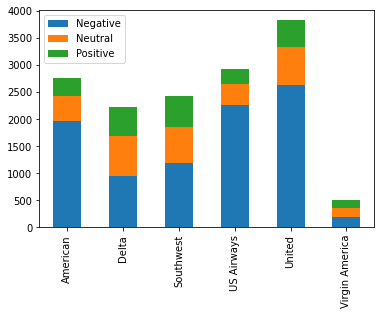

In [ ]:
positive_totals = []
neutral_totals = []
negative_totals = []
airlines = tweets['airline'].sort_values(ascending=True).unique()

for airlineI in airlines:
  tweetsFilter = tweets.loc[tweets['airline'] == airlineI]
  filteredSent = tweetsFilter['airline_sentiment'].value_counts()
  positive_totals.append(filteredSent.get('positive'))
  neutral_totals.append(filteredSent.get('neutral'))
  negative_totals.append(filteredSent.get('negative'))


# width = 0.35       # the width of the bars: can also be len(x) sequence

# fig, ax = plt.subplots()
# airlines = tweets['airline'].sort_values(ascending=True).unique()

# ax.bar(airlines, positive_totals, width, bottom=neutral_totals, label='Positive',color='g')
# ax.bar(airlines, neutral_totals, width , bottom=negative_totals, label='Neutral',color='orange')
# ax.bar(airlines, negative_totals, width,  label='Negative',color='red')

# ax.set_ylabel('Sentiment')
# ax.set_title('Airline')
# ax.legend()

# plt.show()


df = pd.DataFrame(index= airlines, 
                  data={'Negative': negative_totals,
                        'Neutral': neutral_totals,
                        'Positive': positive_totals})

ax = df.plot(kind="bar", stacked=True)
#df.sum(axis=1).plot(ax=ax, color="k")

plt.show()

**Airline & Sentiment Confidence**

*Categorical & Numerical*




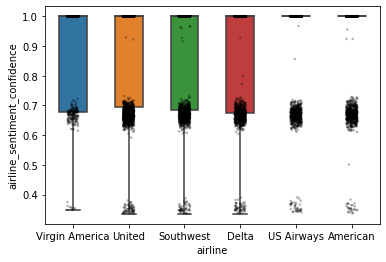

In [ ]:
#make boxplot with Seaborn
bplot = sns.boxplot(y='airline_sentiment_confidence', x='airline', data=tweets, width=0.5, showfliers=False)
#tweets.boxplot(by='airline', column=['airline_sentiment_confidence'], grid=False)

#add stripplot to boxplot with Seaborn
bplot = sns.stripplot(y='airline_sentiment_confidence', x='airline',jitter=True, data=tweets, marker='o', alpha=0.3, color='black', size=2.5)

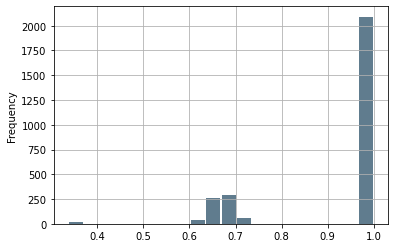

In [ ]:
tweetsAmerican = tweets.loc[tweets['airline'] == 'American']
tweetsAmerican['airline_sentiment_confidence'].plot.hist(grid=True, bins=20, rwidth=0.9,color='#607c8e')

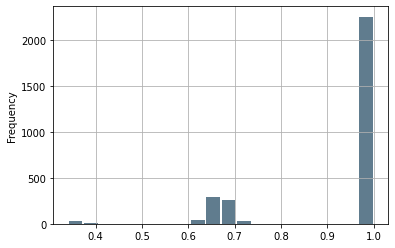

In [ ]:
tweetsUS = tweets.loc[tweets['airline'] == 'US Airways']
tweetsUS['airline_sentiment_confidence'].plot.hist(grid=True, bins=20, rwidth=0.9,color='#607c8e')

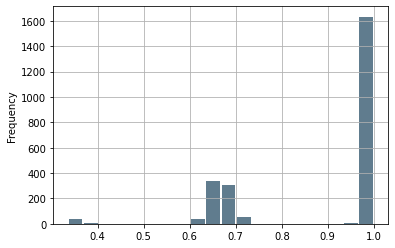

In [ ]:
tweetsDelta = tweets.loc[tweets['airline'] == 'Southwest']
tweetsDelta['airline_sentiment_confidence'].plot.hist(grid=True, bins=20, rwidth=0.9,color='#607c8e')

In [ ]:
tweetsSentConf = tweets['airline_sentiment_confidence']
tweetsSentConf[].value_counts().plot.bar()

**Datetime & Sentiment**

*Other & Categorical*

- heatmap

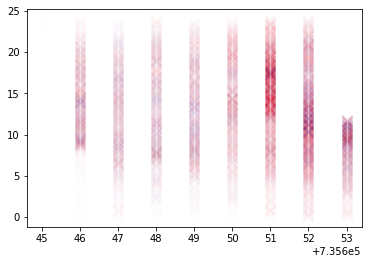

In [ ]:


def hours(t):
  return t.hour + t.minute/60 + t.second/3600

tweetsPositive = tweets.loc[tweets['airline_sentiment'] == 'positive']
tweetsNeutral = tweets.loc[tweets['airline_sentiment'] == 'neutral']
tweetsNegative = tweets.loc[tweets['airline_sentiment'] == 'negative']


dates_string_pos = tweetsPositive['tweet_created']
date_DT_pos = [datetime.strptime(d[:-6],'%Y-%m-%d %H:%M:%S') for d in dates_string_pos]
dates_float_ls_pos = [dts.date2num(d.date()) for d in date_DT_pos]
times_int_ls_pos = [hours(d) for d in date_DT_pos]

dates_string_neu = tweetsNeutral['tweet_created']
date_DT_neu = [datetime.strptime(d[:-6],'%Y-%m-%d %H:%M:%S') for d in dates_string_neu]
dates_float_ls_neu = [dts.date2num(d.date()) for d in date_DT_neu]
times_int_ls_neu = [hours(d) for d in date_DT_neu]

dates_string_neg = tweetsNegative['tweet_created']
date_DT_neg = [datetime.strptime(d[:-6],'%Y-%m-%d %H:%M:%S') for d in dates_string_neg]
dates_float_ls_neg = [dts.date2num(d.date()) for d in date_DT_neg]
times_int_ls_neg = [hours(d) for d in date_DT_neg]

plt.scatter(dates_float_ls_pos,times_int_ls_pos,alpha=0.005,cmap='viridis',s=100,c='g',marker='x')
plt.scatter(dates_float_ls_neu,times_int_ls_neu,alpha=0.005, cmap='viridis', s=100,c='b',marker='x')
plt.scatter(dates_float_ls_neg,times_int_ls_neg,alpha=0.005, cmap='viridis', s=100,c='r',marker='x')

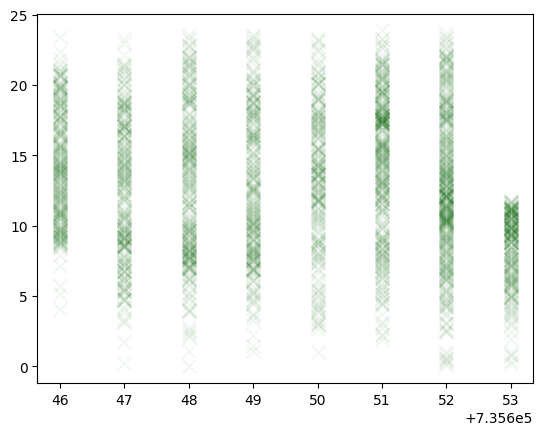

In [ ]:
plt.scatter(dates_float_ls_pos,times_int_ls_pos,alpha=0.05,cmap='viridis',s=100,c='darkgreen',marker='x')
plt.style.use('default')


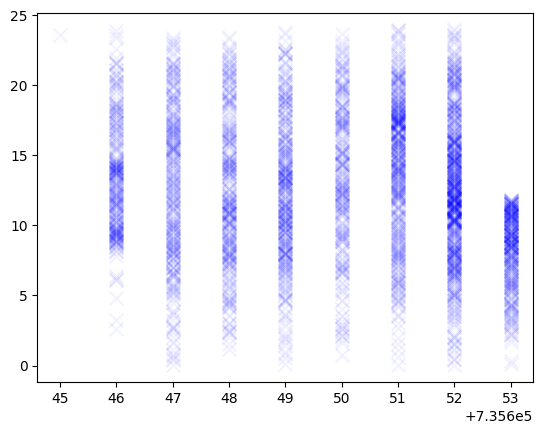

In [ ]:
plt.scatter(dates_float_ls_neu,times_int_ls_neu,alpha=0.05, cmap='viridis', s=100,c='b',marker='x')
plt.style.use('default')

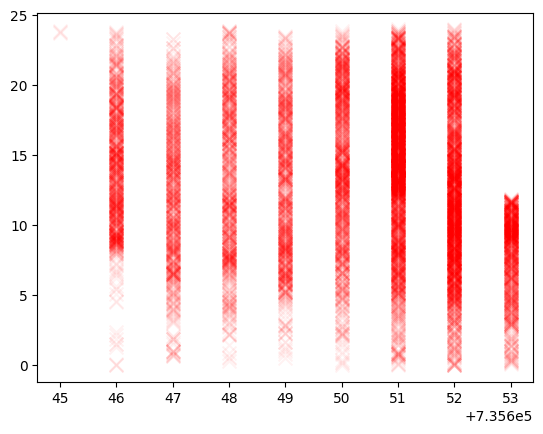

In [ ]:
plt.scatter(dates_float_ls_neg,times_int_ls_neg,alpha=0.05, cmap='viridis', s=100,c='r',marker='x')
plt.style.use('default')


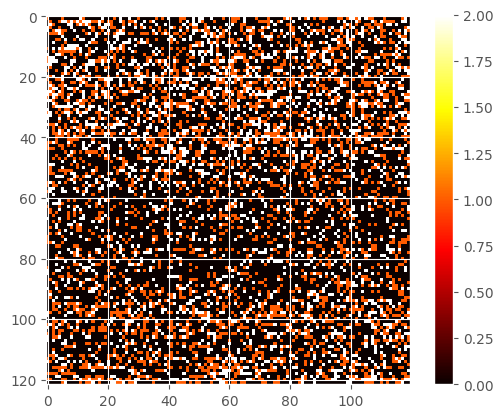

In [ ]:
numericSentiment = []

tweetsTimeSorted = tweets.sort_values(by=['tweet_created'])
categories = tweets['airline_sentiment'].sort_values(ascending=True).unique()

for elem in tweetsTimeSorted['airline_sentiment']:
  for category in categories:
    if elem == category:
      categoryValue = np.where(categories == category)
      numericSentiment.append(categoryValue[0][0])



numSentimentM = np.array(numericSentiment).reshape((122,120))

plt.imshow(numSentimentM, cmap='hot',  interpolation='nearest')
plt.colorbar()
plt.show()

Key:
- White = Positive
- Red = Neutral
- Black = Negative



**Location & Sentiment**


*Other & Categorical*

- grouped barplot
- 3 separate pie charts

Text(0.5, 0, 'Location')

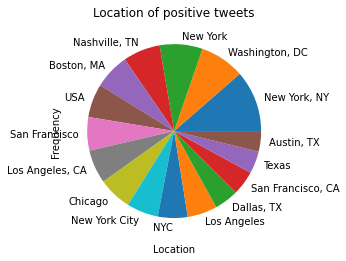

In [ ]:
tweetLocationPos = tweetsPositive['tweet_location'].value_counts()
tweetLocationNeu = tweetsNeutral['tweet_location'].value_counts()
tweetLocationNeg = tweetsNegative['tweet_location'].value_counts()

tweetLocationPos[tweetLocationPos>10].plot.pie()
plt.title("Location of positive tweets")
plt.ylabel("Frequency")
plt.xlabel("Location")

Text(0.5, 0, 'Location')

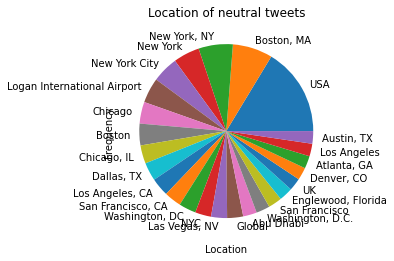

In [ ]:
tweetLocationNeu[tweetLocationNeu>10].plot.pie()
plt.title("Location of neutral tweets")
plt.ylabel("Frequency")
plt.xlabel("Location")

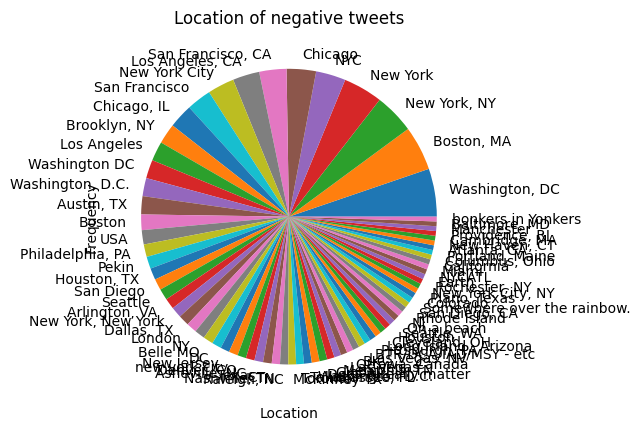

In [ ]:
tweetLocationNeg[tweetLocationNeg>10].plot.pie()
plt.title("Location of negative tweets")
plt.ylabel("Frequency")
plt.xlabel("Location")
plt.style.use('ggplot')

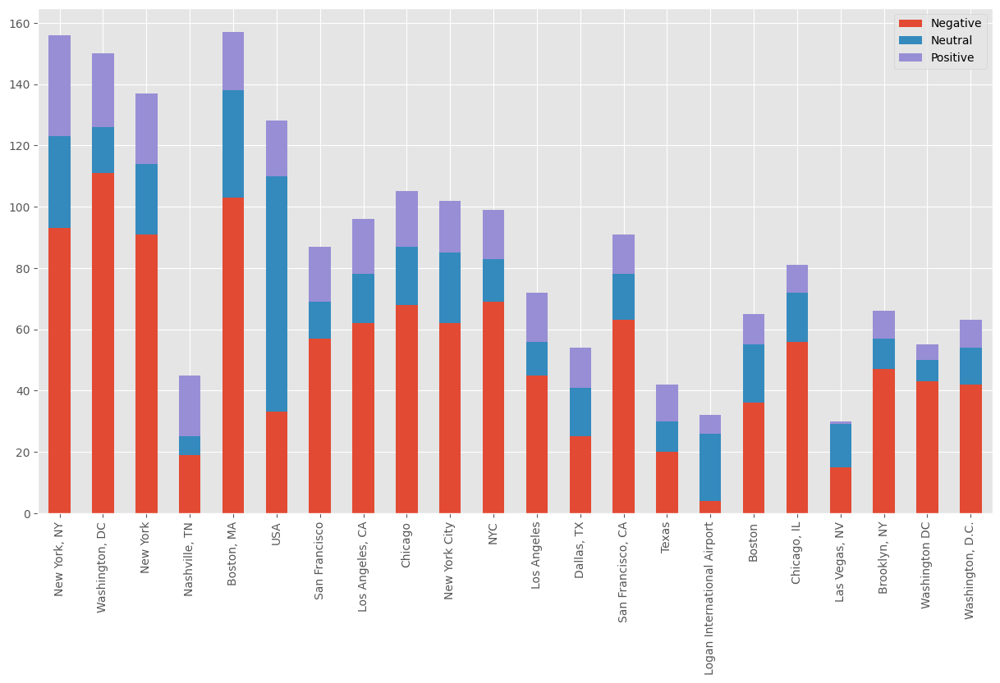

In [ ]:
positive_totals = []
neutral_totals = []
negative_totals = []


topLocationPos = tweetLocationPos[:15].index.tolist()
topLocationNeu = tweetLocationNeu[:15].index.tolist()
topLocationNeg = tweetLocationNeg[:15].index.tolist()

topLocations=list(itertools.chain(topLocationPos, topLocationNeu, topLocationNeg))

topLocations = list(dict.fromkeys(topLocations))
for locI in topLocations:
  positive_totals.append(tweetLocationPos.get(locI))
  neutral_totals.append(tweetLocationNeu.get(locI))
  negative_totals.append(tweetLocationNeg.get(locI))

df = pd.DataFrame(index= topLocations, 
                  data={'Negative': negative_totals,
                        'Neutral': neutral_totals,
                        'Positive': positive_totals})
plt.style.use('ggplot')
ax = df.plot(kind="bar", stacked=True)
# df.sum(axis=1).plot(ax=ax, color="k")
fig = plt.gcf()
fig.set_size_inches(15, 8)
plt.show()

**Timezone & Sentiment**


*Other & Categorical*

- grouped barplot
- 3 separate pie charts


Text(0.5, 0, 'Location')

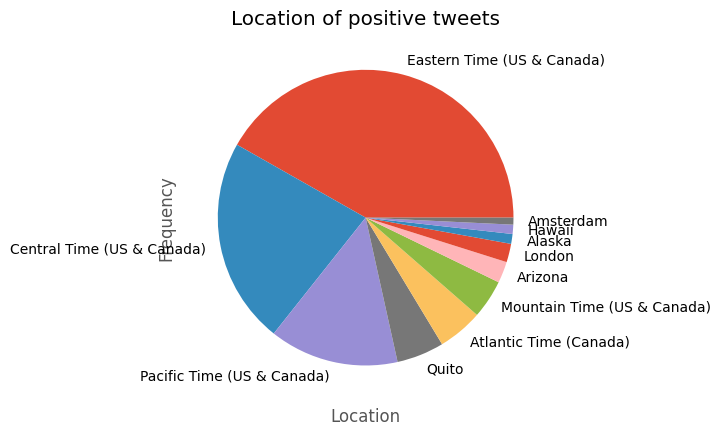

In [ ]:
tweetZonePos = tweetsPositive['user_timezone'].value_counts()
tweetZoneNeu = tweetsNeutral['user_timezone'].value_counts()
tweetZoneNeg = tweetsNegative['user_timezone'].value_counts()

tweetZonePos[tweetZonePos>10].plot.pie()
plt.title("Location of positive tweets")
plt.ylabel("Frequency")
plt.xlabel("Location")

Text(0.5, 0, 'Location')

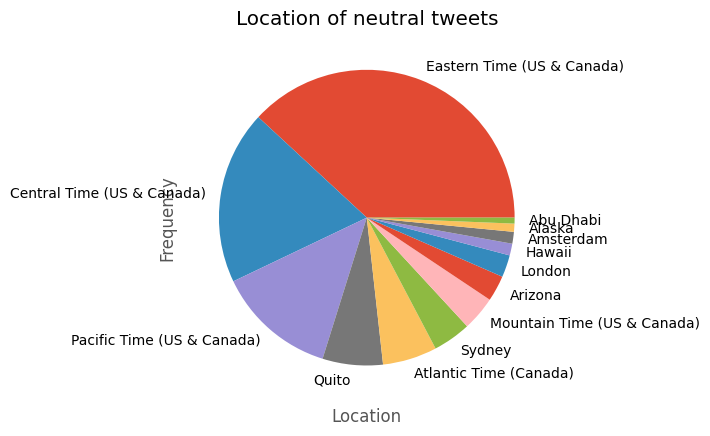

In [ ]:
tweetZoneNeu[tweetZoneNeu>10].plot.pie()
plt.title("Location of neutral tweets")
plt.ylabel("Frequency")
plt.xlabel("Location")

Text(0.5, 0, 'Location')

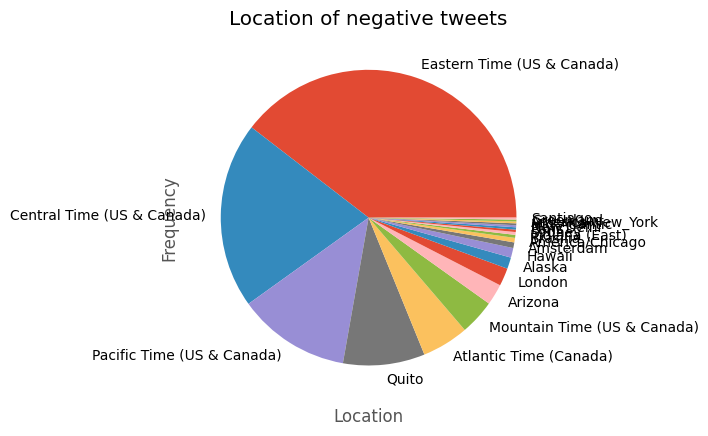

In [ ]:
tweetZoneNeg[tweetZoneNeg>10].plot.pie()
plt.title("Location of negative tweets")
plt.ylabel("Frequency")
plt.xlabel("Location")

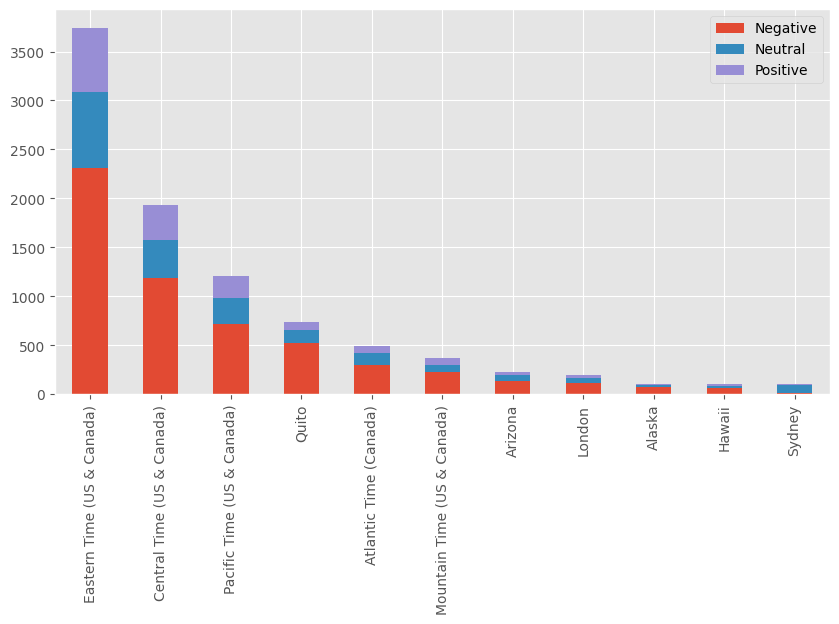

In [ ]:
positive_totals = []
neutral_totals = []
negative_totals = []


topZonePos = tweetZonePos[:10].index.tolist()
topZoneNeu = tweetZoneNeu[:10].index.tolist()
topZoneNeg = tweetZoneNeg[:10].index.tolist()

topZones=list(itertools.chain(topZonePos, topZoneNeu, topZoneNeg))

topZones = list(dict.fromkeys(topZones))
for locI in topZones:
  positive_totals.append(tweetZonePos.get(locI))
  neutral_totals.append(tweetZoneNeu.get(locI))
  negative_totals.append(tweetZoneNeg.get(locI))

df = pd.DataFrame(index= topZones, 
                  data={'Negative': negative_totals,
                        'Neutral': neutral_totals,
                        'Positive': positive_totals})
plt.style.use('ggplot')
ax = df.plot(kind="bar", stacked=True)
# df.sum(axis=1).plot(ax=ax, color="k")
fig = plt.gcf()
fig.set_size_inches(10, 5)
plt.show()

**Co-ords & Sentiment**


*Numerical & Categorical*

- Coloured map 

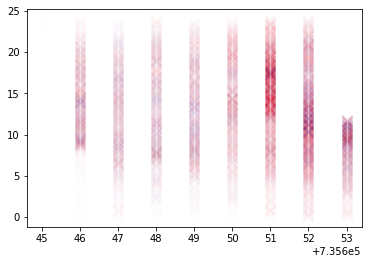

In [ ]:
tweetsPositive = tweets.loc[tweets['airline_sentiment'] == 'positive']
tweetsNeutral = tweets.loc[tweets['airline_sentiment'] == 'neutral']
tweetsNegative = tweets.loc[tweets['airline_sentiment'] == 'negative']


dates_string_pos = tweetsPositive['tweet_created']
date_DT_pos = [datetime.strptime(d[:-6],'%Y-%m-%d %H:%M:%S') for d in dates_string_pos]
dates_float_ls_pos = [dts.date2num(d.date()) for d in date_DT_pos]
times_int_ls_pos = [hours(d) for d in date_DT_pos]

dates_string_neu = tweetsNeutral['tweet_created']
date_DT_neu = [datetime.strptime(d[:-6],'%Y-%m-%d %H:%M:%S') for d in dates_string_neu]
dates_float_ls_neu = [dts.date2num(d.date()) for d in date_DT_neu]
times_int_ls_neu = [hours(d) for d in date_DT_neu]

dates_string_neg = tweetsNegative['tweet_created']
date_DT_neg = [datetime.strptime(d[:-6],'%Y-%m-%d %H:%M:%S') for d in dates_string_neg]
dates_float_ls_neg = [dts.date2num(d.date()) for d in date_DT_neg]
times_int_ls_neg = [hours(d) for d in date_DT_neg]

plt.scatter(dates_float_ls_pos,times_int_ls_pos,alpha=0.005,cmap='viridis',s=100,c='g',marker='x')
plt.scatter(dates_float_ls_neu,times_int_ls_neu,alpha=0.005, cmap='viridis', s=100,c='b',marker='x')
plt.scatter(dates_float_ls_neg,times_int_ls_neg,alpha=0.005, cmap='viridis', s=100,c='r',marker='x')

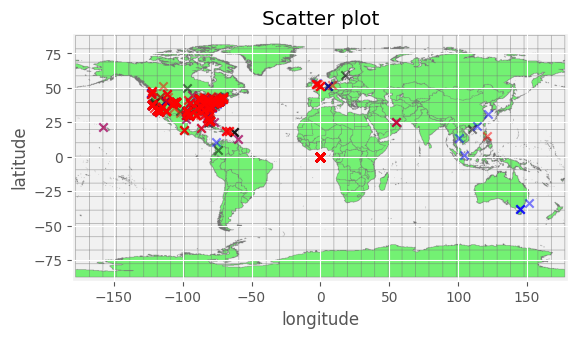

In [ ]:
 xCoordPos = []
 yCoordPos = []
 xCoordNeu = []
 yCoordNeu = []
 xCoordNeg = []
 yCoordNeg = []
 
coordsPos = tweetsPositive['tweet_coord']
coordsNeu = tweetsNeutral['tweet_coord']
coordsNeg = tweetsNegative['tweet_coord']

for coord in coordsPos:
   #print("type: "+str(type(coord))+", coord: "+str(coord))
   if (type(coord) == str) and (coord != 'nan'):#not NaN
     space = coord.find(' ')
     yCoordPos.append(float(coord[1:space-1]))
     bracket = coord.find(']')
     xCoordPos.append(float(coord[space+1:bracket]))

for coord in coordsNeu:
   #print("type: "+str(type(coord))+", coord: "+str(coord))
   if (type(coord) == str) and (coord != 'nan'):#not NaN
     space = coord.find(' ')
     yCoordNeu.append(float(coord[1:space-1]))
     bracket = coord.find(']')
     xCoordNeu.append(float(coord[space+1:bracket]))

for coord in coordsNeg:
   #print("type: "+str(type(coord))+", coord: "+str(coord))
   if (type(coord) == str) and (coord != 'nan'):#not NaN
     space = coord.find(' ')
     yCoordNeg.append(float(coord[1:space-1]))
     bracket = coord.find(']')
     xCoordNeg.append(float(coord[space+1:bracket]))


# Change shape of marker
# sns.regplot(x=df["longitude"], y=df["latitude"], marker="+", fit_reg=False)
# coordsNumericSentiment = []
# tweetsCoordsNotNull = tweets.loc[tweets['tweet_coord'] != 'NaN']
# categories = tweets['airline_sentiment'].sort_values(ascending=True).unique()

# for elem in tweetsCoordsNotNull['airline_sentiment']:
#   for category in categories:
#     if elem == category:
#       categoryValue = np.where(categories == category)
#       coordsNumericSentiment.append(categoryValue[0][0]/2)


plt.imshow(im, extent=[-180, 180, -90, 90], alpha=0.5)

plt.scatter(xCoordPos,yCoordPos,alpha=0.5,marker='x',c= 'black')
plt.scatter(xCoordNeu,yCoordNeu,alpha=0.5,marker='x',c= 'b')
plt.scatter(xCoordNeg,yCoordNeg,alpha=0.5,marker='x',c= 'r')

plt.title('Scatter plot')
plt.xlabel('longitude')
plt.ylabel('latitude')
plt.show()

*Sentiment: black - positive, blue - neutral, red - negative*

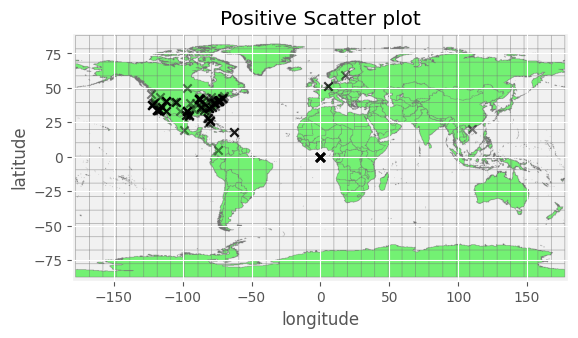

In [ ]:
plt.imshow(im, extent=[-180, 180, -90, 90], alpha=0.5)

plt.scatter(xCoordPos,yCoordPos,alpha=0.5,marker='x',c= 'black')


plt.title('Positive Scatter plot')
plt.xlabel('longitude')
plt.ylabel('latitude')
plt.show()

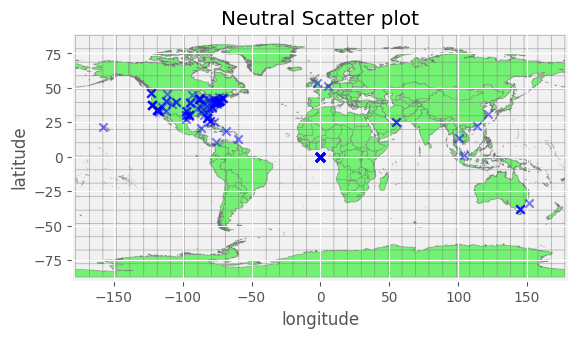

In [ ]:
plt.imshow(im, extent=[-180, 180, -90, 90], alpha=0.5)


plt.scatter(xCoordNeu,yCoordNeu,alpha=0.5,marker='x',c= 'b')


plt.title('Neutral Scatter plot')
plt.xlabel('longitude')
plt.ylabel('latitude')
plt.show()

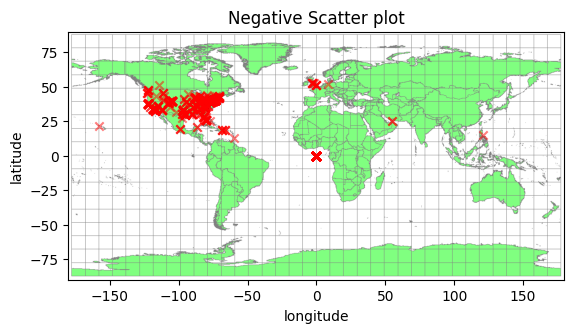

In [ ]:
plt.imshow(im, extent=[-180, 180, -90, 90], alpha=0.5)


plt.scatter(xCoordNeg,yCoordNeg,alpha=0.5,marker='x',c= 'r')


plt.title('Negative Scatter plot')
plt.xlabel('longitude')
plt.ylabel('latitude')
plt.show()

**Retweet Count & Sentiment**


*Numerical & Categorical*

- boxplot/violin

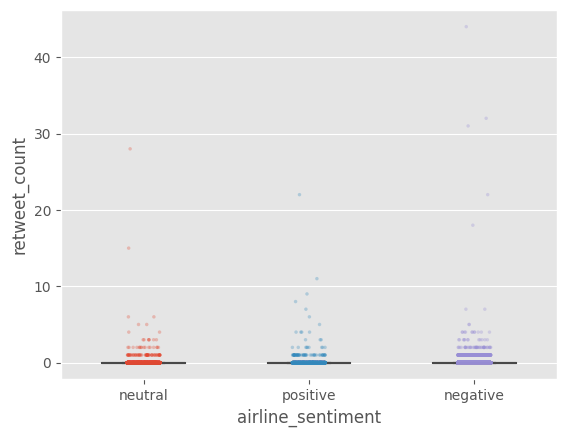

In [ ]:
#make boxplot with Seaborn
bplot = sns.boxplot(y='retweet_count', x='airline_sentiment', data=tweets, width=0.5, showfliers=False)
#tweets.boxplot(by='airline', column=['airline_sentiment_confidence'], grid=False)

#add stripplot to boxplot with Seaborn
bplot = sns.stripplot(y='retweet_count', x='airline_sentiment',jitter=True, data=tweets, marker='o', alpha=0.3, size=2.5)

**Text & Sentiment**


*Other & Categorical*

- 3 separate word maps

Positive

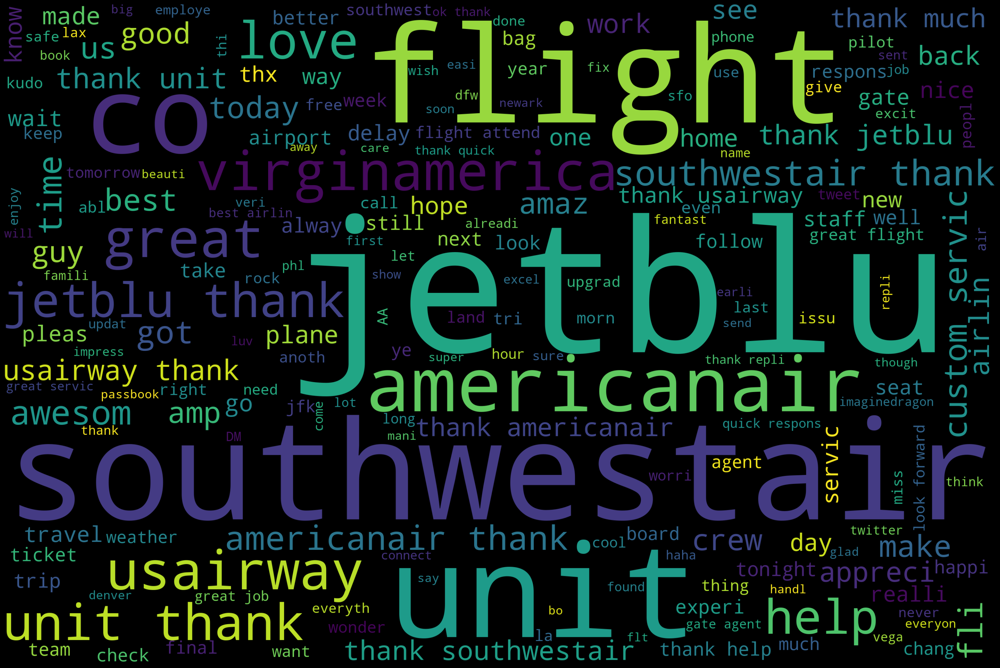

In [ ]:

tweet_textPos = tweetsPositive['text']
tweet_textNeu = tweetsNeutral['text']
tweet_textNeg = tweetsNegative['text']

tweet_sentencesPos = [elem.split() for elem in tweet_textPos]
tweet_sentencesNeu = [elem.split() for elem in tweet_textNeu]
tweet_sentencesNeg = [elem.split() for elem in tweet_textNeg]

tweet_wordsPos = list(itertools.chain.from_iterable(tweet_sentencesPos))
tweet_wordsNeu = list(itertools.chain.from_iterable(tweet_sentencesNeu))
tweet_wordsNeg = list(itertools.chain.from_iterable(tweet_sentencesNeg))

counterPos = Counter(tweet_wordsPos)
counterNeu = Counter(tweet_wordsNeu)
counterNeg = Counter(tweet_wordsNeg)


tweet_textCleanPos = ' '.join(tweet_wordsPos)
tweet_textCleanNeu = ' '.join(tweet_wordsNeu)
tweet_textCleanNeg = ' '.join(tweet_wordsNeg)

wordcloud = WordCloud(
    width = 3000,
    height = 2000,
    background_color = 'black',
    stopwords = STOPWORDS).generate(str(tweet_textCleanPos))
fig = plt.figure(
    figsize = (40, 30),
    facecolor = 'k',
    edgecolor = 'k')
plt.imshow(wordcloud, interpolation = 'bilinear')
plt.axis('off')
plt.tight_layout(pad=0)
plt.show()

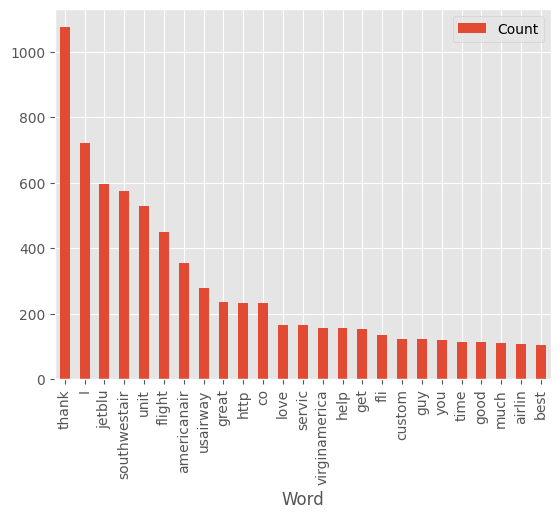

In [ ]:
most_occur = counterPos.most_common(25)
df2 = pd.DataFrame(most_occur,columns = ['Word','Count'])
df2.plot.bar(x='Word',y='Count')

Neutral 

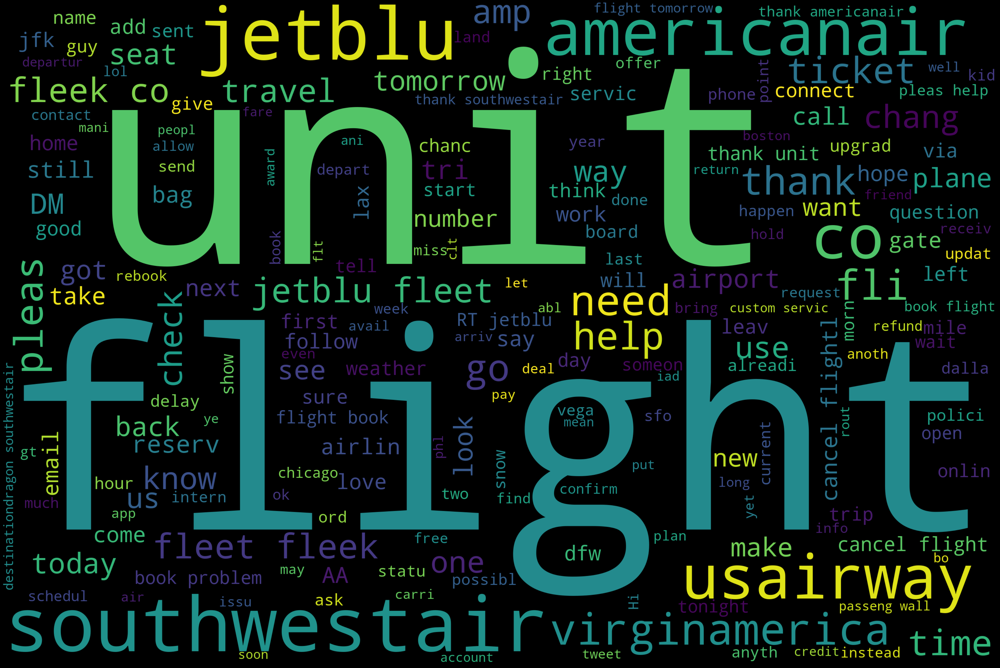

In [ ]:
wordcloud = WordCloud(
    width = 3000,
    height = 2000,
    background_color = 'black',
    stopwords = STOPWORDS).generate(str(tweet_textCleanNeu))
fig = plt.figure(
    figsize = (40, 30),
    facecolor = 'k',
    edgecolor = 'k')
plt.imshow(wordcloud, interpolation = 'bilinear')
plt.axis('off')
plt.tight_layout(pad=0)
plt.show()

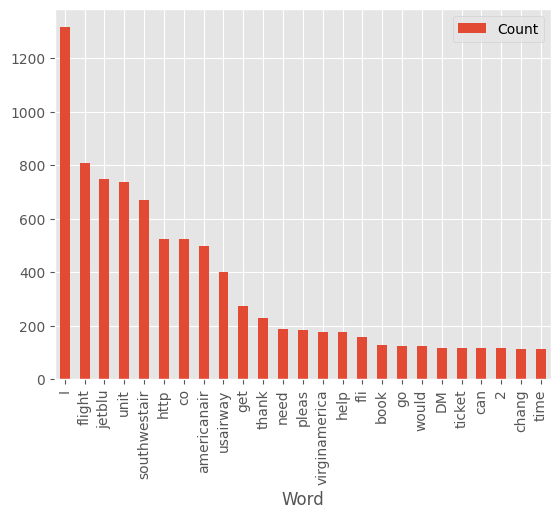

In [ ]:
most_occur = counterNeu.most_common(25)
df2 = pd.DataFrame(most_occur,columns = ['Word','Count'])
df2.plot.bar(x='Word',y='Count')

Negative

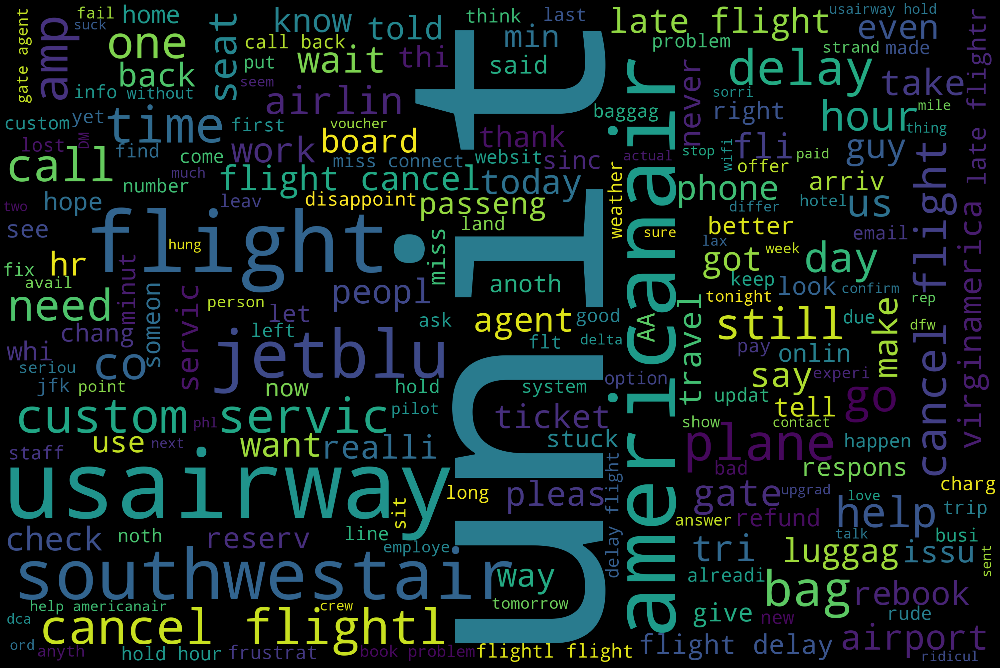

In [ ]:
wordcloud = WordCloud(
    width = 3000,
    height = 2000,
    background_color = 'black',
    stopwords = STOPWORDS).generate(str(tweet_textCleanNeg))
fig = plt.figure(
    figsize = (40, 30),
    facecolor = 'k',
    edgecolor = 'k')
plt.imshow(wordcloud, interpolation = 'bilinear')
plt.axis('off')
plt.tight_layout(pad=0)
plt.show()

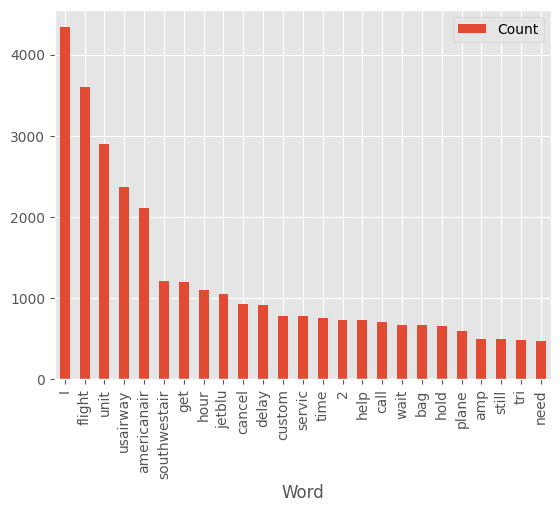

In [ ]:
most_occur = counterNeg.most_common(25)
df2 = pd.DataFrame(most_occur,columns = ['Word','Count'])
df2.plot.bar(x='Word',y='Count')

**Negative reason & Airline**


*Categorical & Categorical*

- stacked barplot


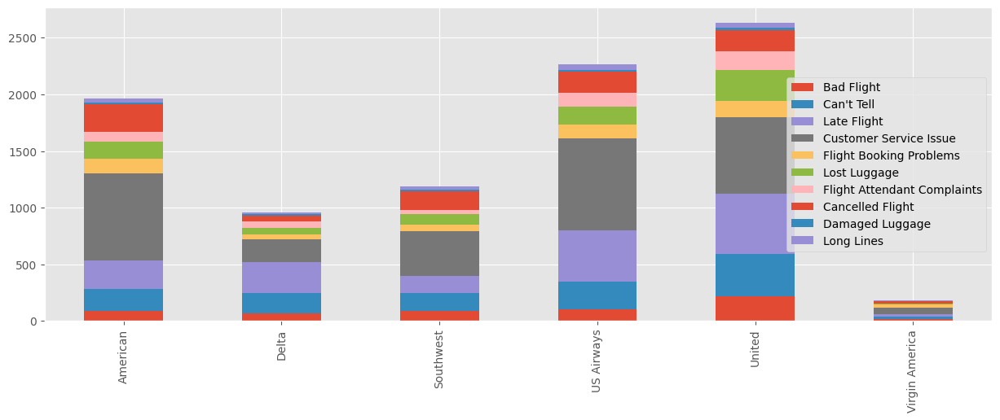

In [ ]:
badflight_totals = []
canttell_totals = []
late_totals = []
service_totals = []
booking_totals = []
lost_totals = []
flight_totals = []
cancelled_totals = []
damaged_totals = []
long_totals = []


negativeReasons = tweets['negativereason'].unique()
airlines = tweets['airline'].sort_values(ascending=True).unique()

for airlineI in airlines:
  tweetsFilter = tweets.loc[tweets['airline'] == airlineI]
  filteredSent = tweetsFilter['negativereason'].value_counts()
  badflight_totals.append(filteredSent.get('Bad Flight'))
  canttell_totals.append(filteredSent.get('Can\'t Tell'))
  late_totals.append(filteredSent.get('Late Flight'))
  service_totals.append(filteredSent.get('Customer Service Issue'))
  booking_totals.append(filteredSent.get('Flight Booking Problems'))
  lost_totals.append(filteredSent.get('Lost Luggage'))
  flight_totals.append(filteredSent.get('Flight Attendant Complaints'))
  cancelled_totals.append(filteredSent.get('Cancelled Flight'))
  damaged_totals.append(filteredSent.get('Damaged Luggage'))
  long_totals.append(filteredSent.get('longlines'))

df = pd.DataFrame(index= airlines, 
                  data={'Bad Flight': badflight_totals,
                        'Can\'t Tell': canttell_totals,
                        'Late Flight': late_totals,
                        'Customer Service Issue': service_totals,
                        'Flight Booking Problems': booking_totals,
                        'Lost Luggage': lost_totals,
                        'Flight Attendant Complaints': flight_totals,
                        'Cancelled Flight': cancelled_totals,
                        'Damaged Luggage': damaged_totals,
                        'Long Lines': long_totals
                        })
plt.style.use('ggplot')
ax = df.plot(kind="bar", stacked=True)
# df.sum(axis=1).plot(ax=ax, color="k")
fig = plt.gcf()
fig.set_size_inches(15, 5)
plt.show()

**Name & sentiment**

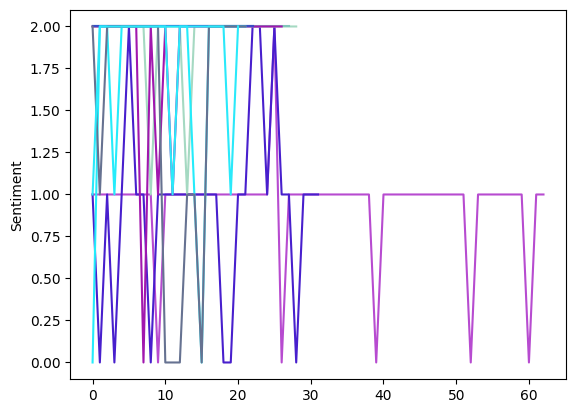

In [ ]:
tweetsNameCount = tweets['name'].value_counts()
topAccounts = tweetsNameCount[:10].index.tolist()

for account in topAccounts:
  tweetsFilter = tweets.loc[tweets['name'] == account]
  sentimentFileter = tweetsFilter['airline_sentiment']
  accountSentNum = []
  for sentI in sentimentFileter:
    if sentI == 'positive':
      accountSentNum.append(0)
    elif sentI == 'neutral':
      accountSentNum.append(1)
    else: 
      accountSentNum.append(2)

    r = random.random()
    b = random.random()
    g = random.random()
    randColor = (r, g, b)
  plt.plot(accountSentNum,c=randColor)
  plt.ylabel("Sentiment")

plt.show()

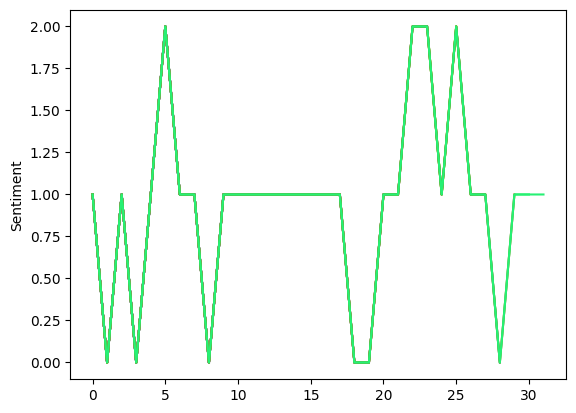

In [ ]:
account = tweetsNameCount.index.tolist()[1]
tweetsFilter = tweets.loc[tweets['name'] == account]
sentimentFileter = tweetsFilter['airline_sentiment']
accountSentNum = []
for sentI in sentimentFileter:
  if sentI == 'positive':
    accountSentNum.append(0)
  elif sentI == 'neutral':
    accountSentNum.append(1)
  else: 
    accountSentNum.append(2)

  r = random.random()
  b = random.random()
  g = random.random()
  randColor = (r, g, b)
  plt.plot(accountSentNum,c=randColor)
  plt.ylabel("Sentiment")

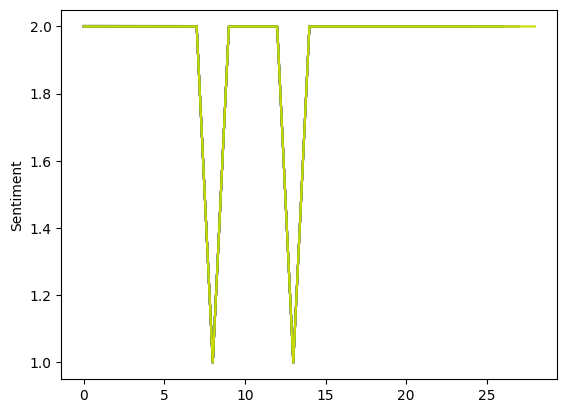

In [ ]:
account = tweetsNameCount.index.tolist()[2]
tweetsFilter = tweets.loc[tweets['name'] == account]
sentimentFileter = tweetsFilter['airline_sentiment']
accountSentNum = []
for sentI in sentimentFileter:
  if sentI == 'positive':
    accountSentNum.append(0)
  elif sentI == 'neutral':
    accountSentNum.append(1)
  else: 
    accountSentNum.append(2)

  r = random.random()
  b = random.random()
  g = random.random()
  randColor = (r, g, b)
  plt.plot(accountSentNum,c=randColor)
  plt.ylabel("Sentiment")

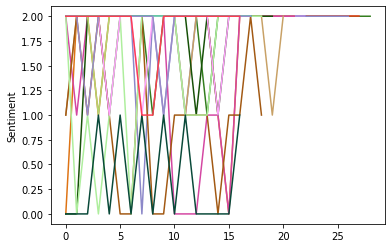

In [ ]:
tweetsNameCount = tweets['name'].value_counts()
topAccounts = tweetsNameCount[2:20].index.tolist()

for account in topAccounts:
  tweetsFilter = tweets.loc[tweets['name'] == account]
  sentimentFileter = tweetsFilter['airline_sentiment']
  accountSentNum = []
  for sentI in sentimentFileter:
    if sentI == 'positive':
      accountSentNum.append(0)
    elif sentI == 'neutral':
      accountSentNum.append(1)
    else: 
      accountSentNum.append(2)

    r = random.random()
    b = random.random()
    g = random.random()
    randColor = (r, g, b)
  plt.plot(accountSentNum,c=randColor)
  plt.ylabel("Sentiment")

plt.show()

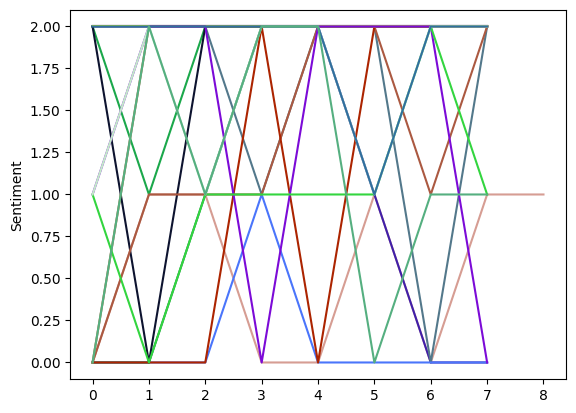

In [ ]:
tweetsNameCount = tweets['name'].value_counts()
topAccounts = tweetsNameCount[100:120].index.tolist()

for account in topAccounts:
  tweetsFilter = tweets.loc[tweets['name'] == account]
  sentimentFileter = tweetsFilter['airline_sentiment']
  accountSentNum = []
  for sentI in sentimentFileter:
    if sentI == 'positive':
      accountSentNum.append(0)
    elif sentI == 'neutral':
      accountSentNum.append(1)
    else: 
      accountSentNum.append(2)

    r = random.random()
    b = random.random()
    g = random.random()
    randColor = (r, g, b)
  plt.plot(accountSentNum,c=randColor)
  plt.ylabel("Sentiment")

plt.show()

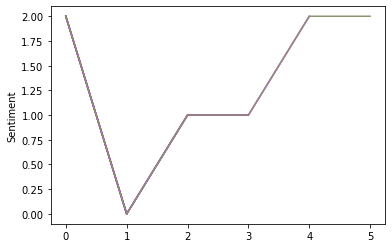

In [ ]:
account = tweetsNameCount.index.tolist()[221]
tweetsFilter = tweets.loc[tweets['name'] == account]
sentimentFileter = tweetsFilter['airline_sentiment']
accountSentNum = []
for sentI in sentimentFileter:
  if sentI == 'positive':
    accountSentNum.append(0)
  elif sentI == 'neutral':
    accountSentNum.append(1)
  else: 
    accountSentNum.append(2)

  r = random.random()
  b = random.random()
  g = random.random()
  randColor = (r, g, b)
  plt.plot(accountSentNum,c=randColor)
  plt.ylabel("Sentiment")

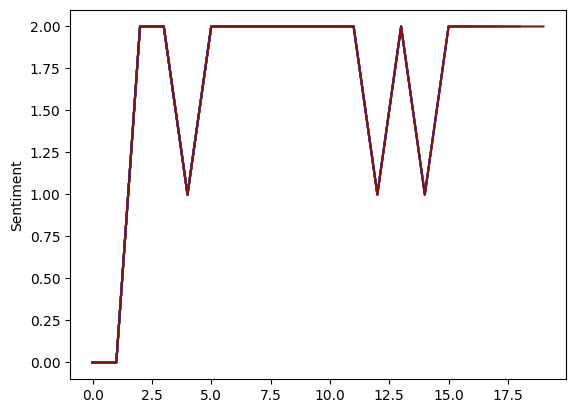

In [ ]:
account = tweetsNameCount.index.tolist()[10]
tweetsFilter = tweets.loc[tweets['name'] == account]
sentimentFileter = tweetsFilter['airline_sentiment']
accountSentNum = []
for sentI in sentimentFileter:
  if sentI == 'positive':
    accountSentNum.append(0)
  elif sentI == 'neutral':
    accountSentNum.append(1)
  else: 
    accountSentNum.append(2)

  r = random.random()
  b = random.random()
  g = random.random()
  randColor = (r, g, b)
  plt.plot(accountSentNum,c=randColor)
  plt.ylabel("Sentiment")

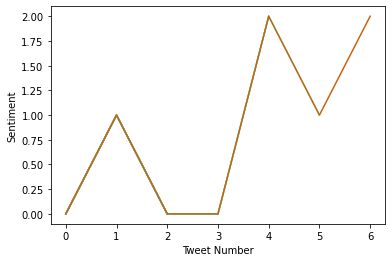

In [ ]:
account = tweetsNameCount.index.tolist()[150]
tweetsFilter = tweets.loc[tweets['name'] == account]
sentimentFileter = tweetsFilter['airline_sentiment']
accountSentNum = []
for sentI in sentimentFileter:
  if sentI == 'positive':
    accountSentNum.append(0)
  elif sentI == 'neutral':
    accountSentNum.append(1)
  else: 
    accountSentNum.append(2)

  r = random.random()
  b = random.random()
  g = random.random()
  randColor = (r, g, b)
  plt.plot(accountSentNum,c=randColor)
  plt.ylabel("Sentiment")
  plt.xlabel("Tweet Number")

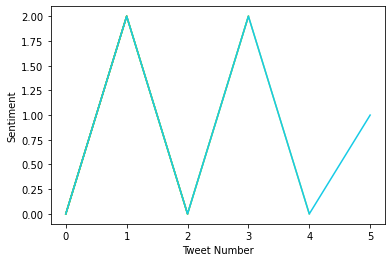

In [ ]:
# 118 constant negative
account = tweetsNameCount.index.tolist()[256]
tweetsFilter = tweets.loc[tweets['name'] == account]
sentimentFileter = tweetsFilter['airline_sentiment']
accountSentNum = []
for sentI in sentimentFileter:
  if sentI == 'positive':
    accountSentNum.append(0)
  elif sentI == 'neutral':
    accountSentNum.append(1)
  else: 
    accountSentNum.append(2)

  r = random.random()
  b = random.random()
  g = random.random()
  randColor = (r, g, b)
  plt.plot(accountSentNum,c=randColor)
  plt.ylabel("Sentiment")
  plt.xlabel("Tweet Number")

**Sentiment confidence & sentiment**

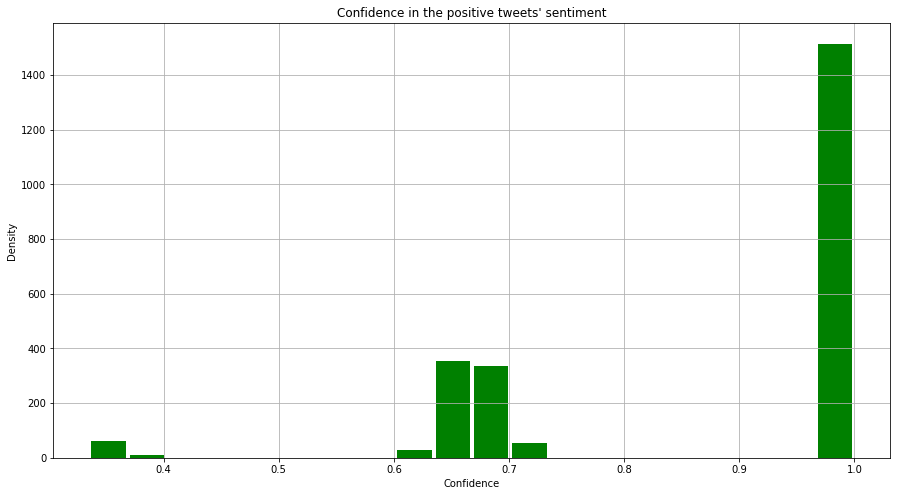

In [ ]:
tweetsPositive['airline_sentiment_confidence'].plot.hist(grid=True, bins=20, rwidth=0.9, color='green')
plt.title("Confidence in the positive tweets' sentiment")
plt.ylabel("Density")
plt.xlabel("Confidence")
# plt.ylim([0,8000])
fig = plt.gcf()
fig.set_size_inches(15, 8)
plt.show()

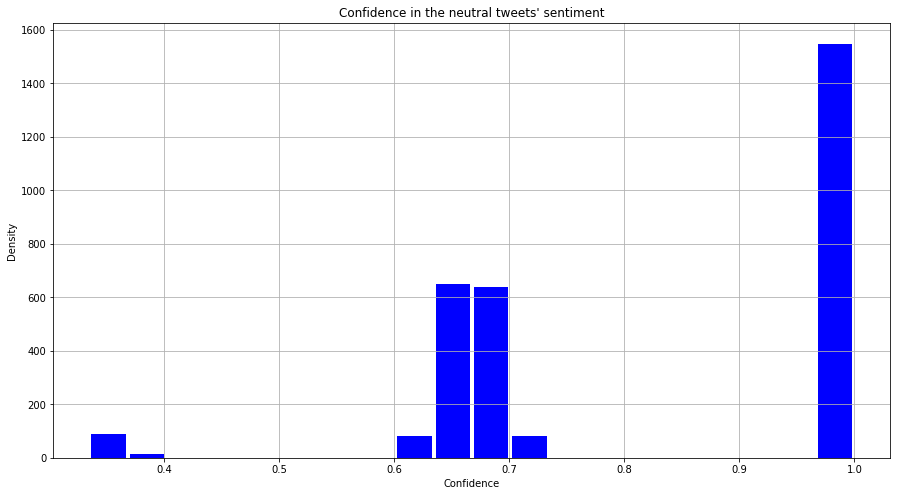

In [ ]:

tweetsNeutral['airline_sentiment_confidence'].plot.hist(grid=True, bins=20, rwidth=0.9, color='blue')
plt.title("Confidence in the neutral tweets' sentiment")
plt.ylabel("Density")
plt.xlabel("Confidence")
# plt.ylim([0,8000])
fig = plt.gcf()
fig.set_size_inches(15, 8)
plt.show()

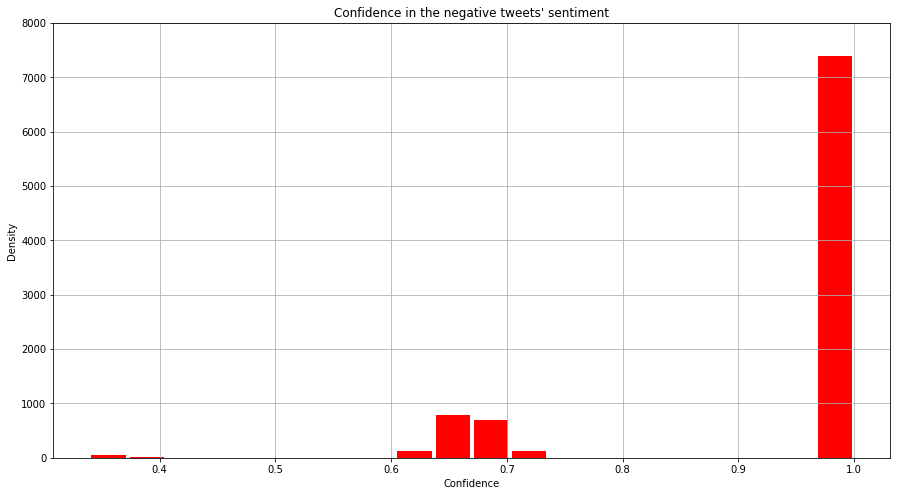

In [ ]:
tweetsNegative['airline_sentiment_confidence'].plot.hist(grid=True, bins=20, rwidth=0.9, color='red')
plt.title("Confidence in the negative tweets' sentiment")
plt.ylabel("Density")
plt.xlabel("Confidence")
plt.ylim([0,8000])
fig = plt.gcf()
fig.set_size_inches(15, 8)
plt.show()